[consejos google pro](https://colab.research.google.com/notebooks/pro.ipynb)

# SEGMENTACION MEDIANTE U-NET + Resnet152 y


    def dice_loss(y_true, y_pred, smooth=1) #smooth=1e-5
      y_true = tf.cast(y_true, tf.float32)
      intersection = tf.reduce_sum(y_true * y_pred)
      suma = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred)
      dice_score = (2.0 * intersection + smooth) / (suma + smooth)
      dice_loss = 1.0 - dice_score
      return dice_loss

* UNet es una red totalmente convolucional (FCN) que realiza segmentación de imágenes. Su Objetivo es predecir la clase de cada píxel (si pertenece al fondo (Background), o a una estructura especifica (Foreground)).

* UNet se basa en el FCN y se modifica de manera que produce una mejor segmentación en imágenes médicas.

## 1.1 Arquitectura
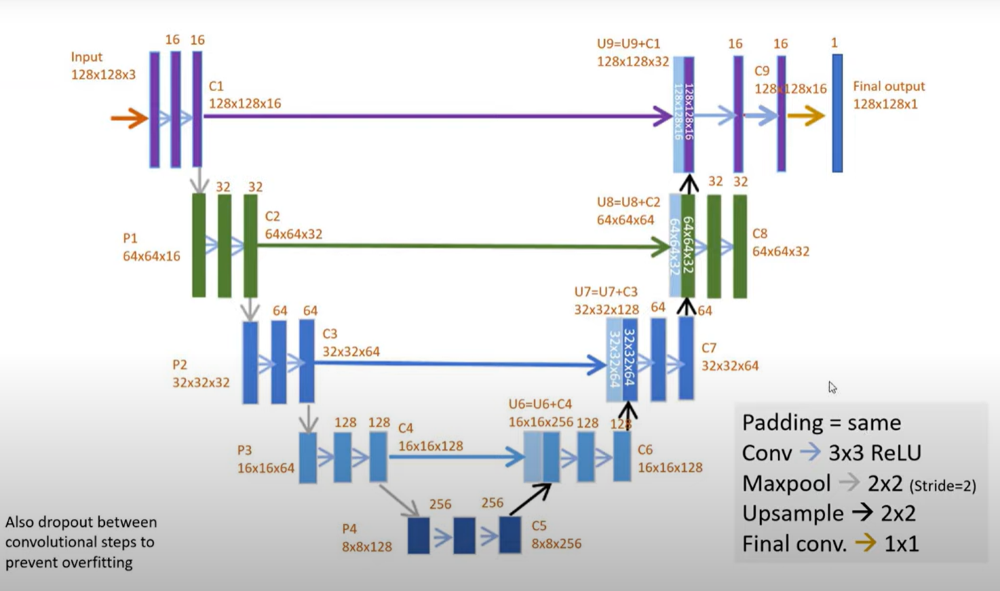

### La Arquitectura de U-Net tiene 4 partes:


    1 Contracción / disminución de muestras

    2 Cuello de Botella

    3 Expansión / aumento de muestras

    4 Salto de Conexion

## 1.4 Codigo

In [1]:
## Imports
import os
import random

import numpy as np
import cv2
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras


## Seeding
seed = 2019
random.seed = seed
np.random.seed = seed
tf.seed = seed

In [2]:
from PIL import Image

def image_display(image_pathlist, mask_pathlist, index):
    # input: image and mask filepath and the index
    # output matplotlib images
    image = Image.open(image_pathlist[index]).convert("L") #agregamos .convert("L")
    imagearray = np.array(image)
    print('Image shape: ', imagearray.shape)


    mask = Image.open(mask_pathlist[index]).convert("L") #agregamos .convert("L")
    maskarray = np.array(mask)
    print('Mask shape: ', maskarray.shape)

    #fig, ax = plt.subplots(3,figsize=(5,10))
    fig, ax = plt.subplots(1,3,figsize=(14,4)) #cambié para que se vean horizontales
    ax[0].imshow(imagearray, aspect='auto', cmap='gray')
    ax[1].imshow(maskarray, aspect='auto', cmap='gray')
    ax[2].imshow(imagearray, aspect='auto', cmap = 'gray')
    ax[2].imshow(maskarray, cmap = 'Reds', aspect='auto', alpha = 0.4)

In [3]:
def finetune_unfreezeall(base_model):
    base_model = base_model

    # unfreeze the contracting path and freeze the expanding path
    for layer in base_model.layers:
        if layer.name in ['block1_conv1', 'block1_conv2', 'block1_pool',
                          'block2_conv1', 'block2_conv2', 'block2_pool',
                          'block3_conv1', 'block3_conv2', 'block3_conv3', 'block3_pool',
                          'block4_conv1', 'block4_conv2', 'block4_conv3', 'block4_pool',
                          'block5_conv1', 'block5_conv2', 'block5_conv3']:
            layer.trainable = True

    return base_model

## Clase para Aumentacion de datos completa, con esquinas y doble flip

In [4]:
print('con aumentación de datos completa: cantidad x',4*5*5) # n cantidad de imágenes, 4: flip ,v h, ambos o ninguno, 5x5 traslac v y h
print('con aumentación de datos completa simple: cantidad x',4*3*3) # n cantidad de imágenes, 4: flip ,v h, ambos o ninguno, 5x5 traslac v y h


con aumentación de datos completa: cantidad x 100
con aumentación de datos completa simple: cantidad x 36


In [5]:
#
class DataAugmentation:
    def __init__(self, images):
        self.images = images
        self.output = []

    def process_images(self):
        image_files = self.images
        for file_name in image_files:
            image = file_name
            if image.shape[0] < 512:
                diff_rows = 512 - image.shape[0]
                image = np.vstack((image, np.zeros((diff_rows, image.shape[1]), dtype=np.uint8)))

            if image.shape[1] < 512:
                diff_cols = 512 - image.shape[1]
                image = np.hstack((image, np.zeros((image.shape[0], diff_cols), dtype=np.uint8)))

            self.apply_transformations(image)


    def apply_transformations(self, image):




        for i in range(-4,5,8):   #range(-4,5,2)=[-4,-2, 0, 2, 4]
          for j in range(-4,5,4):
            translate = self.apply_translation(image, 32 * i, 32*j)
            translated_right_cropped = self.adjust_image_size(translate, 512, 512)
            self.save_transformed_images(translated_right_cropped)

            flip_horizontal_right = cv2.flip(translated_right_cropped, 1)
            self.save_transformed_images(flip_horizontal_right)

            flip_vertical_right = cv2.flip(translated_right_cropped, 0)
            self.save_transformed_images(flip_vertical_right)

            flip_both_right = cv2.flip(flip_horizontal_right, 0)  #agregado!
            self.save_transformed_images(flip_both_right)     #agregado!


    def apply_translation(self, image, x_offset, y_offset):
        rows, cols = image.shape
        M = np.float32([[1, 0, x_offset], [0, 1, y_offset]])
        translated_image = cv2.warpAffine(image, M, (cols, rows))
        return translated_image

    def save_transformed_images(self, image):

        self.output.append(image)

    def save_image(self, image):
        self.output.append(image)


    def adjust_image_size(self, image, target_width, target_height):
        height, width = image.shape
        x_offset = (width - target_width) // 2
        y_offset = (height - target_height) // 2
        new_image = image[y_offset:y_offset + target_height, x_offset:x_offset + target_width]

        return new_image



In [6]:
def image_comparac(monocroma, etiqueta, red):
    # input: image and mask filepath and the index
    # output matplotlib images

    fig, ax = plt.subplots(1,4,figsize=(16,4)) #cambié para que se vean horizontales
    ax[0].imshow(monocroma, aspect='auto', cmap='gray')
    ax[0].set_title('monocroma')
    ax[1].imshow(etiqueta, aspect='auto', cmap='gray')
    ax[1].set_title('Ground Truth')
    ax[2].set_title('Predicción')
    ax[2].imshow(red, aspect='auto', cmap = 'gray')
    ax[3].imshow(monocroma, aspect='auto', cmap='gray')
    ax[3].imshow(etiqueta, cmap = 'Reds', aspect='auto', alpha = 0.4)
    ax[3].imshow(red, cmap = 'Blues', aspect='auto', alpha = 0.4)

## Leer las imagenes

In [7]:
# Este comando es para leer los archivos directamente desde Drive

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [8]:
path_train = "/content/drive/MyDrive/Proyecto_Sadosky/base_final/clean_database/train"
path_test = "/content/drive/MyDrive/Proyecto_Sadosky/base_final/clean_database/test"

In [9]:
path_train = "/content/drive/MyDrive/Sadosky_EcoDoppler/Investigación/Procesamiento/base_final/clean_database/train"
path_test = "/content/drive/MyDrive/Sadosky_EcoDoppler/Investigación/Procesamiento/base_final/clean_database/test"


In [10]:
#database_path = os.path.join(path_train, "clean_png_train")#era para la base vieja
database_path = path_train

files_train = os.listdir(database_path)

images_train = [item for item in files_train if 'labeled' not in item]

random.shuffle(images_train)

print(f'Total number of Train images: {len(images_train)}')
print(images_train)

train_ids = images_train

Total number of Train images: 493
['443.png', '336.png', '337.png', '17.png', '343.png', '215.png', '441.png', '365.png', '263.png', '213.png', '340.png', '19.png', '152.png', '170.png', '110.png', '136.png', '32.png', '284.png', '196.png', '127.png', '305.png', '449.png', '8.png', '333.png', '366.png', '75.png', '135.png', '234.png', '175.png', '354.png', '200.png', '342.png', '414.png', '44.png', '62.png', '94.png', '272.png', '392.png', '64.png', '231.png', '142.png', '154.png', '252.png', '301.png', '481.png', '453.png', '435.png', '463.png', '42.png', '281.png', '52.png', '302.png', '373.png', '546.png', '390.png', '92.png', '344.png', '364.png', '46.png', '83.png', '407.png', '148.png', '149.png', '306.png', '292.png', '157.png', '484.png', '11.png', '161.png', '178.png', '323.png', '378.png', '244.png', '246.png', '411.png', '258.png', '82.png', '61.png', '459.png', '1.png', '216.png', '465.png', '395.png', '387.png', '296.png', '391.png', '461.png', '106.png', '240.png', '402.p

In [11]:
train_images = []
train_masks = []

for image_id in train_ids:


    image_path = os.path.join(database_path, str(image_id))
    train_images.append(image_path)
    mask_path = os.path.join(database_path, image_id.replace(".png","")) + "_labeled.png"
    train_masks.append(mask_path)

## Cargo las imagenes en memoria

In [12]:
Xtrain = []

Ytrain = []


for image_id in train_ids:


    image_path = os.path.join(database_path, str(image_id))
    mask_path = os.path.join(database_path, image_id.replace(".png","")) + "_labeled.png"
    image = cv2.imread(image_path, 0)
    mask = cv2.imread(mask_path, 0)
    Xtrain.append(image)
    Ytrain.append(mask)


In [13]:
len(Xtrain)

493

In [14]:
# hacemos la aumentacion de datos de train

X_train_data_augmentation = DataAugmentation(Xtrain)
X_train_data_augmentation.process_images()


In [15]:
Xtrain2 = X_train_data_augmentation.output


In [16]:
X_train = np.asarray(Xtrain2, dtype=np.uint8)
print('Xtrain:',X_train.shape)



Xtrain: (11832, 512, 512)


In [17]:
Y_train_data_augmentation = DataAugmentation(Ytrain)
Y_train_data_augmentation.process_images()

In [18]:
Ytrain2 =  Y_train_data_augmentation.output

In [19]:
Y_train = np.asarray(Ytrain2, dtype=bool)
print('Ytrain:',Y_train.shape)


Ytrain: (11832, 512, 512)


## Metricas para medir el desempeno de la red

In [20]:
import tensorflow.keras.backend as K

# intersection over union

def jacard_coef(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)

    intersection = K.sum(y_true * y_pred)

    return (intersection + 1.0) / (K.sum(y_true) + K.sum(y_pred) - intersection + 1.0)

def jacard_coef_loss(y_true, y_pred):
    return -jacard_coef(y_true, y_pred)

In [21]:
def jacard_coef_np(y_true, y_pred):
  y_true=y_true.astype('float32')
  y_pred=y_pred.astype('float32')
  intersection = np.sum(y_true * y_pred)
  return (intersection + 1.0) / (np.sum(y_true) + np.sum(y_pred) - intersection + 1.0)

In [22]:
def dice_coef_np(y_true, y_pred):
  y_true=y_true.astype('float32')
  y_pred=y_pred.astype('float32')
  intersection = np.sum(y_true * y_pred)
  return (2*intersection + 1.0) / (np.sum(y_true) + np.sum(y_pred) + 1.0)

In [23]:
import tensorflow.keras.backend as K

def dice_coefficient(y_true, y_pred, smooth=1):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)

    intersection = K.sum(y_true * y_pred)
    suma = K.sum(y_true) + K.sum(y_pred)
    dice = (2.0 * intersection + smooth) / (suma + smooth)
    return dice

def dice_coef_loss(y_true, y_pred):
    return 1 - dice_coefficient(y_true, y_pred)

In [24]:
import tensorflow as tf

def dice_loss_modif0(y_true, y_pred, smooth=1e-5):
    y_true = tf.cast(y_true, tf.float32)

    if sum(y_true) == 0:               #se agrega para controlar los falsos positivos cuando no hay placa en el Ground Truth
      # no tengo placa
      dice_loss = tf.reduce_sum(y_pred) * smooth #en nuestro caso también puede ser /(512**2)

    else:
      intersection = tf.reduce_sum(y_true * y_pred)
      suma = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred)
      dice_score = (2.0 * intersection + smooth) / (suma + smooth)
      dice_loss = 1.0 - dice_score

    return dice_loss

In [25]:
def dice_loss_modif(y_true, y_pred, smooth=1e-5):
    y_true = tf.cast(y_true, tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred)
    dice_score = (2.0 * intersection + smooth) / (union + smooth)
    dice_loss = - dice_score+(tf.reduce_sum(y_pred)*smooth)**2
    return dice_loss

In [26]:
import tensorflow as tf

def dice_loss(y_true, y_pred, smooth=1e-5):
    y_true = tf.cast(y_true, tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred)
    dice_score = (2.0 * intersection + smooth) / (union + smooth)
    dice_loss = 1.0 - dice_score
    return dice_loss

## Modelo de Red neuronal

In [30]:
from tensorflow.keras.applications import ResNet152
from tensorflow.keras.layers import concatenate, Conv2DTranspose, Conv2D, Dropout
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2

def TL_unet_model(input_shape):
  #def TL_unet_model(input_shape, dropout_rate=0.5, l2_penalty=1e-3):
    img_input = Input(shape=(input_shape, input_shape, 1))
    img_conc = concatenate([img_input, img_input, img_input])

    base_ResNet = ResNet152(include_top=False,
                            weights="imagenet",
                            input_tensor=img_conc)

    # Freezing all layers in ResNet152
    for layer in base_ResNet.layers:
        layer.trainable = False

    bridge = base_ResNet.output

    # Decoder now
    up1 = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(bridge)
    concat_1 = concatenate([up1, base_ResNet.get_layer("conv4_block36_out").output], axis=3)
    conv6 = Conv2D(512, (3, 3), activation='relu', padding='same')(concat_1)
    conv6 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv6)
    #conv6 = Dropout(dropout_rate)(conv6)

    up2 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv6)
    concat_2 = concatenate([up2, base_ResNet.get_layer("conv3_block8_out").output], axis=3)
    conv7 = Conv2D(256, (3, 3), activation='relu', padding='same')(concat_2)
    conv7 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv7)
    #conv7 = Dropout(dropout_rate)(conv7)

    up3 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv7)
    concat_3 = concatenate([up3, base_ResNet.get_layer("conv2_block3_out").output], axis=3)
    conv8 = Conv2D(128, (3, 3), activation='relu', padding='same')(concat_3)
    conv8 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv8)
    #conv8 = Dropout(dropout_rate)(conv8)

    up4 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv8)
    concat_4 = concatenate([up4, base_ResNet.get_layer("conv1_conv").output], axis=3)
    conv9 = Conv2D(64, (3, 3), activation='relu', padding='same')(concat_4)
    conv9 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv9)
    #conv9 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(l2_penalty))(concat_4)
    #conv9 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(l2_penalty))(conv9)
    #conv9 = Dropout(dropout_rate)(conv9)

    up5 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv9)
    concat_5 = concatenate([up5, img_input], axis=3)
    conv10 = Conv2D(32, (3, 3), activation='relu', padding='same')(concat_5)
    conv10 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv10)
    #conv10 = Dropout(dropout_rate)(conv10)

    conv11 = Conv2D(1, (1, 1), activation='sigmoid')(conv10)

    model = Model(inputs=[img_input], outputs=[conv11])

    return model


In [31]:
from tensorflow.keras.optimizers import Adam

# NOTA: cuando uso "adam", sin especificar el Learning rate, el algoritmo no converge y hace todo mal

#model = TL_unet_model((512, 512, 1),1,True)
model = TL_unet_model(512)
model.compile(optimizer=Adam(learning_rate=1e-4), loss=[dice_loss], metrics=[jacard_coef])
# model.compile(optimizer="sgd", loss=[dice_loss], metrics=[jacard_coef])
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 512, 512, 1)]        0         []                            
                                                                                                  
 concatenate_2 (Concatenate  (None, 512, 512, 3)          0         ['input_2[0][0]',             
 )                                                                   'input_2[0][0]',             
                                                                     'input_2[0][0]']             
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 518, 518, 3)          0         ['concatenate_2[0][0]']       
                                                                                              

## Entrenamiento

## path resultados del modelo

In [32]:
path='/content/drive/MyDrive/Proyecto_Sadosky/modelo_final/resultados/Resnet152/'
path ="/content/drive/MyDrive/Sadosky_EcoDoppler/Investigación/Procesamiento/modelo_final/resultados/Resnet152/"

In [33]:
from tensorflow.keras.callbacks import ModelCheckpoint

In [ ]:
## Validation Data Size  80:20

# creo que los valores adecuados para correr en cluster son:
# epochs = 20
# batch_size = 32

epochs = 40
batch_size = 16 # con 32 me da error

#checkpoint_path = '/content/drive/MyDrive/Proyecto_Sadosky/unet_plaque_segmentation.hdf5'
#checkpoint_path = '/content/drive/MyDrive/Proyecto_Sadosky/resultados/result1608/unet_plaque_segmentation.hdf5'
checkpoint_path = path+'unet_plaque_segmentation.hdf5'

model_checkpoint = ModelCheckpoint(checkpoint_path,
                                    verbose=1,
                                    monitor='val_loss',
                                    save_best_only=True)

callbacks_list = [model_checkpoint]

results = model.fit(X_train, Y_train, validation_split=0.2, batch_size=batch_size, epochs=epochs, callbacks=callbacks_list)


Epoch 1/40
592/592 [==============================] - ETA: 0s - loss: 0.6348 - jacard_coef: 0.2300
Epoch 1: val_loss improved from inf to 0.68352, saving model to /content/drive/MyDrive/Sadosky_EcoDoppler/Investigación/Procesamiento/modelo_final/resultados/Resnet152/unet_plaque_segmentation.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


592/592 [==============================] - 946s 2s/step - loss: 0.6348 - jacard_coef: 0.2300 - val_loss: 0.6835 - val_jacard_coef: 0.2209
Epoch 2/40
592/592 [==============================] - ETA: 0s - loss: 0.4531 - jacard_coef: 0.3803
Epoch 2: val_loss improved from 0.68352 to 0.60742, saving model to /content/drive/MyDrive/Sadosky_EcoDoppler/Investigación/Procesamiento/modelo_final/resultados/Resnet152/unet_plaque_segmentation.hdf5
592/592 [==============================] - 861s 1s/step - loss: 0.4531 - jacard_coef: 0.3803 - val_loss: 0.6074 - val_jacard_coef: 0.2884
Epoch 3/40
592/592 [==============================] - ETA: 0s - loss: 0.3569 - jacard_coef: 0.4771
Epoch 3: val_loss improved from 0.60742 to 0.58489, saving model to /content/drive/MyDrive/Sadosky_EcoDoppler/Investigación/Procesamiento/modelo_final/resultados/Resnet152/unet_plaque_segmentation.hdf5
592/592 [==============================] - 859s 1s/step - loss: 0.3569 - jacard_coef: 0.4771 - val_loss: 0.5849 - val_jaca

## Ver desempeno de la red

## visualizamos curvas de entrenamiento

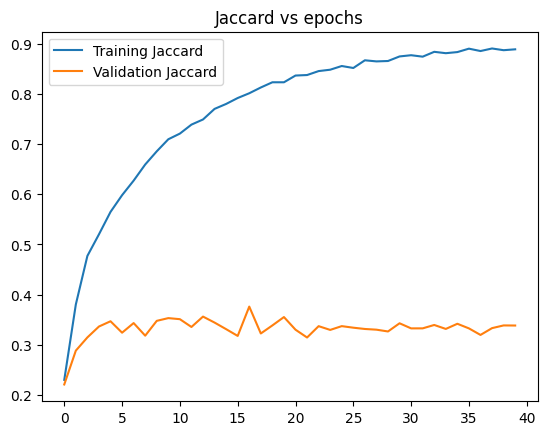

In [ ]:
## visualizamos curvas de entrenamiento

plt.figure()
plt.title("Jaccard vs epochs")
plt.plot( results.history['jacard_coef'] )
plt.plot( results.history['val_jacard_coef'] )
plt.legend(['Training Jaccard', 'Validation Jaccard'])
plt.show()

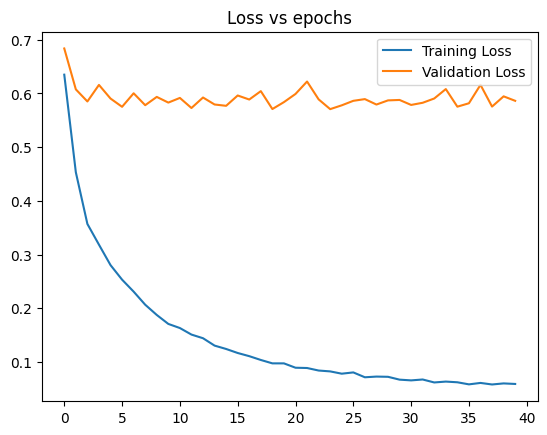

In [ ]:
plt.figure()
plt.title("Loss vs epochs")
plt.plot( results.history['loss'] )
plt.plot( results.history['val_loss'] )
plt.legend(['Training Loss', 'Validation Loss'])
plt.show()

In [ ]:
l=results.history['loss']
path_loss=path+'history_loss.txt'
np.savetxt(path_loss, l)

vl=results.history['val_loss']
path_v_loss=path+'history_val_loss.txt'
np.savetxt(path_v_loss, vl)


In [ ]:
l=results.history['jacard_coef']
path_J=path+'history_Jaccard.txt'
np.savetxt(path_J, l)

vl=results.history['val_jacard_coef']
path_v_J=path+'history_val_Jaccard.txt'
np.savetxt(path_v_J, vl)


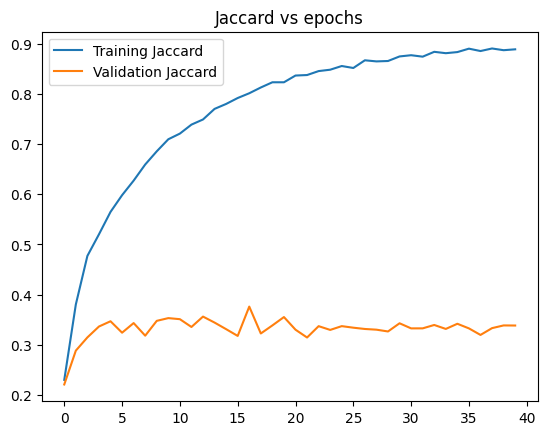

In [ ]:
## visualizamos curvas de entrenamiento

plt.figure()
plt.title("Jaccard vs epochs")
plt.plot( results.history['jacard_coef'] )
plt.plot( results.history['val_jacard_coef'] )
plt.legend(['Training Jaccard', 'Validation Jaccard'])
path1=path+"Jaccard_vs_epochs.png"
plt.savefig(path1)
plt.show()


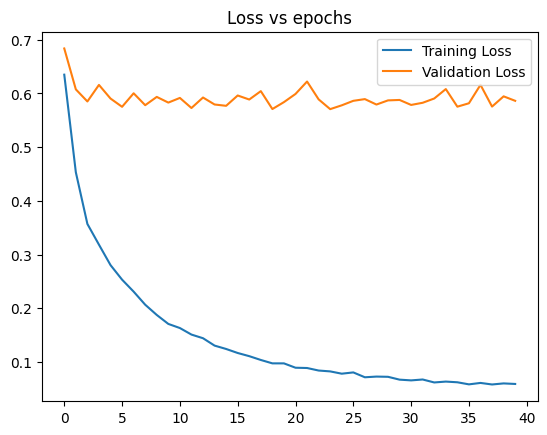

In [ ]:
plt.figure()
plt.title("Loss vs epochs")
plt.plot( results.history['loss'] )
plt.plot( results.history['val_loss'] )
plt.legend(['Training Loss', 'Validation Loss'])
path2=path+"DICE_Loss_vs_epochs.png"
plt.savefig(path2)
plt.show()

# Test

In [ ]:
#database_path_test = os.path.join(path_test, "clean_png_test")
database_path_test = path_test

files_test = os.listdir(database_path_test)

images_test = [item for item in files_test if 'labeled' not in item]

print(f'Total number of Test images: {len(images_test)}')
print(images_test)

test_ids = images_test

Total number of Test images: 48
['499.png', '497.png', '498.png', '504.png', '500.png', '501.png', '505.png', '503.png', '502.png', '509.png', '506.png', '510.png', '507.png', '511.png', '508.png', '513.png', '517.png', '516.png', '512.png', '515.png', '521.png', '519.png', '518.png', '523.png', '522.png', '524.png', '528.png', '527.png', '526.png', '529.png', '525.png', '531.png', '530.png', '534.png', '533.png', '532.png', '535.png', '537.png', '536.png', '540.png', '538.png', '539.png', '543.png', '541.png', '542.png', '544.png', '545.png', '520.png']


In [ ]:
Xtest = []
Ytest = []

for image_id in test_ids:

    image_path = os.path.join(database_path_test, str(image_id))
    mask_path = os.path.join(database_path_test, image_id.replace(".png","")) + "_labeled.png"
    image = cv2.imread(image_path, 0)
    mask = cv2.imread(mask_path, 0)
    Xtest.append(image[144:656, 144:656]) #eligimos el centro de tam 512x512
    Ytest.append(mask[144:656, 144:656]) #eligimos el centro de tam 512x512

In [ ]:
#armar nueva lista
centro_x= 400
centro_y=400

for r in range(len(test_ids)):
  h,w=Xtest[r].shape
  imagenvieja=Xtest[r]

  if h<800 or w<800:
    imagen_auxiliar=np.zeros((800,800),dtype='uint8')
    top_y=(800-h)//2
    left_x=(800-w)//2
    bottom_y = top_y + h
    right_x = left_x+w
    imagen_auxiliar[top_y:bottom_y, left_x:right_x] = imagenvieja
    imagenvieja=imagen_auxiliar


  Xtest[r]= imagenvieja[144:656, 144:656]# 512x512 centrado

In [ ]:
#armar nueva lista
centro_x= 400
centro_y=400

for r in range(len(test_ids)):
  h,w=Ytest[r].shape
  imagenvieja=Ytest[r]

  if h<800 or w<800:
    imagen_auxiliar=np.zeros((800,800),dtype='uint8')
    top_y=(800-h)//2
    left_x=(800-w)//2
    bottom_y = top_y + h
    right_x = left_x+w
    imagen_auxiliar[top_y:bottom_y, left_x:right_x] = imagenvieja
    imagenvieja=imagen_auxiliar


  Ytest[r]= imagenvieja[144:656, 144:656]# 512x512 centrado

In [ ]:
X_test = np.asarray(Xtest, dtype=np.uint8)
print('Xtest:',X_test.shape)

Y_test = np.asarray(Ytest, dtype=bool)
print('Ytest:',Y_test.shape)

r = random.randint(0, len(X_test)-1)

print(X_test[r].shape)
print(Y_test[r].shape)

Xtest: (48, 512, 512)
Ytest: (48, 512, 512)
(512, 512)
(512, 512)


## Predichos para test

In [ ]:
preds = model.predict(X_test[0:270])

2/2 [==============================] - 28s 19ms/step


In [ ]:
result = preds

# aca tenemos que binarizar la prediccion del modelo
result = result > 0.5

imagen499.png
Jaccard: 0.0017311690198512804
DICE: 0.0017311690198512804


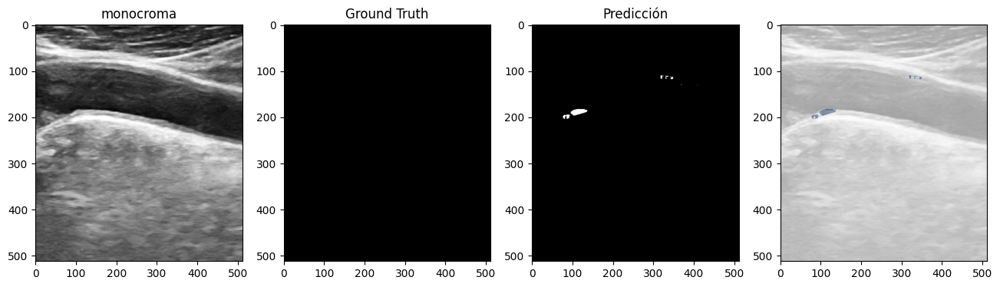

In [ ]:
item = random.randint(0, len(images_test)-1)
#item = 16
monocroma=X_test[item]
etiqueta=Y_test[item]
red=preds[item]
print('imagen'+test_ids[item])
image_comparac(monocroma, etiqueta, red)
print('Jaccard:', jacard_coef_np(Y_test[item], preds[item][:,:,0]))
print('DICE:',dice_coef_np(Y_test[item], preds[item][:,:,0]))


imagen499.png
imagen497.png
imagen498.png
imagen504.png
imagen500.png
imagen501.png
imagen505.png
imagen503.png
imagen502.png
imagen509.png
imagen506.png
imagen510.png
imagen507.png
imagen511.png
imagen508.png
imagen513.png
imagen517.png
imagen516.png
imagen512.png
imagen515.png
imagen521.png


<ipython-input-6-dbab715e00ef>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,4,figsize=(16,4)) #cambié para que se vean horizontales


imagen519.png
imagen518.png
imagen523.png
imagen522.png
imagen524.png
imagen528.png
imagen527.png
imagen526.png
imagen529.png
imagen525.png
imagen531.png
imagen530.png
imagen534.png
imagen533.png
imagen532.png
imagen535.png
imagen537.png
imagen536.png
imagen540.png
imagen538.png
imagen539.png
imagen543.png
imagen541.png
imagen542.png
imagen544.png
imagen545.png
imagen520.png


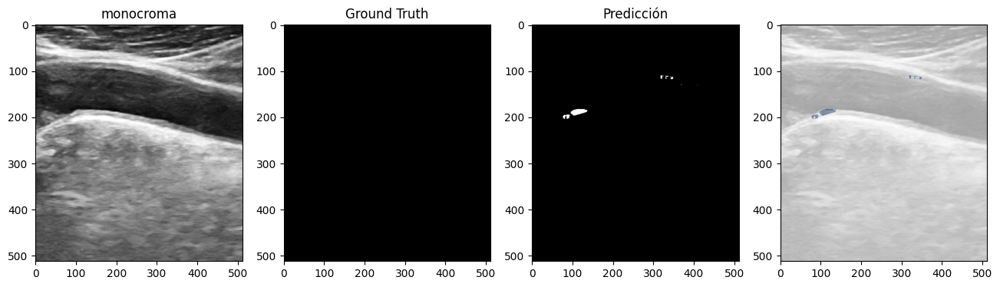

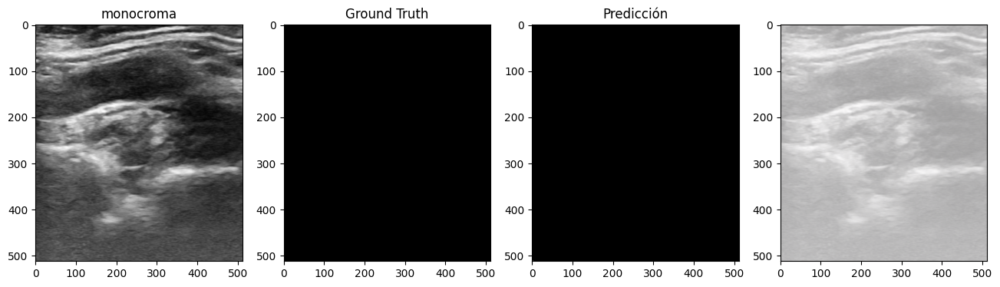

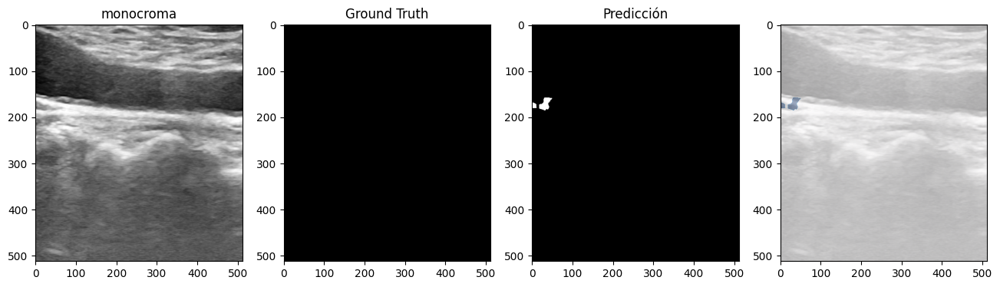

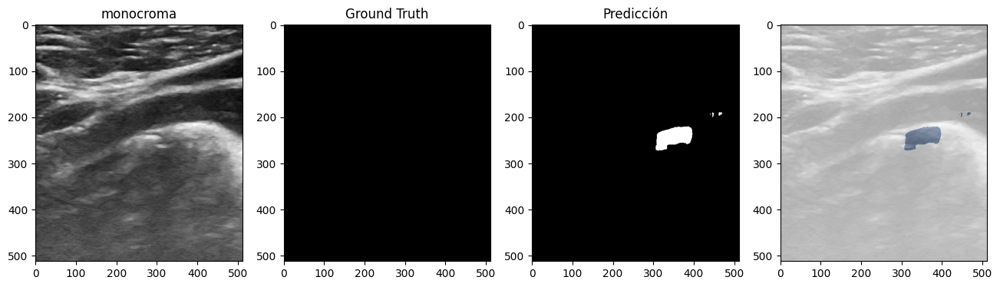

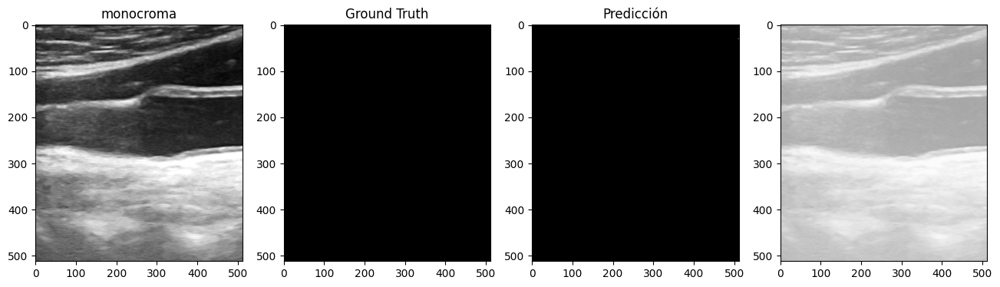

...

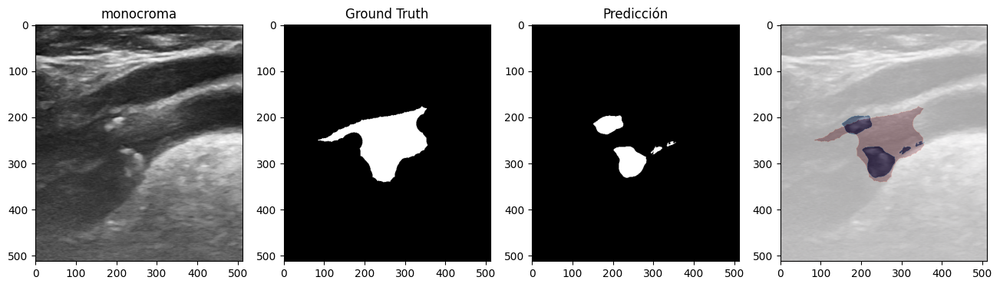

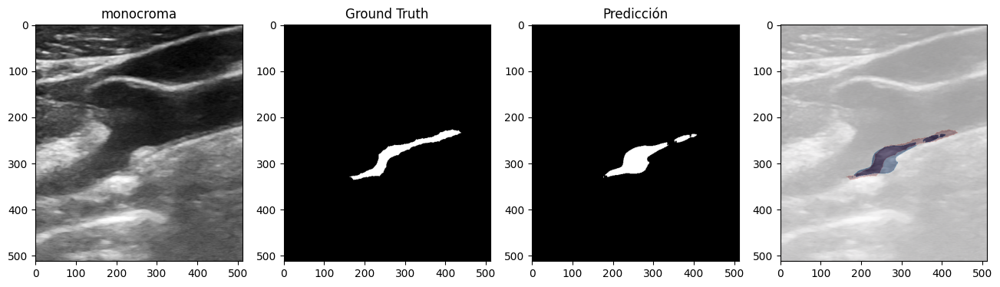

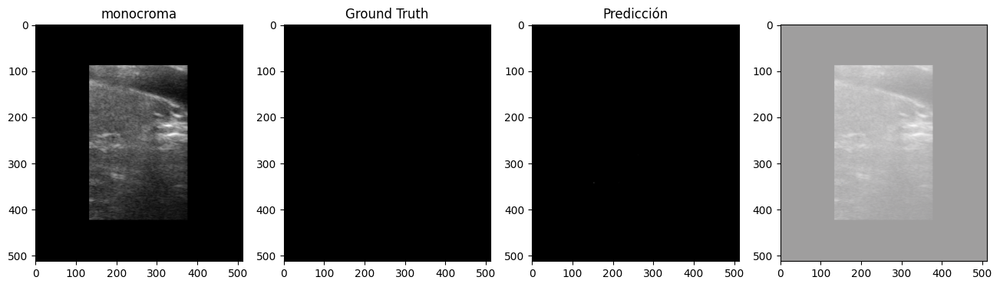

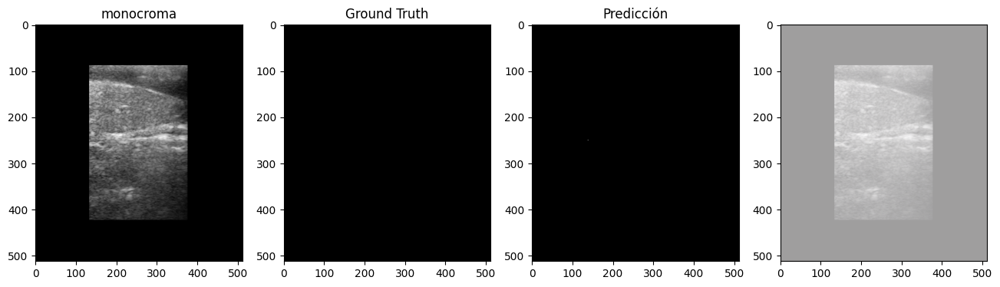

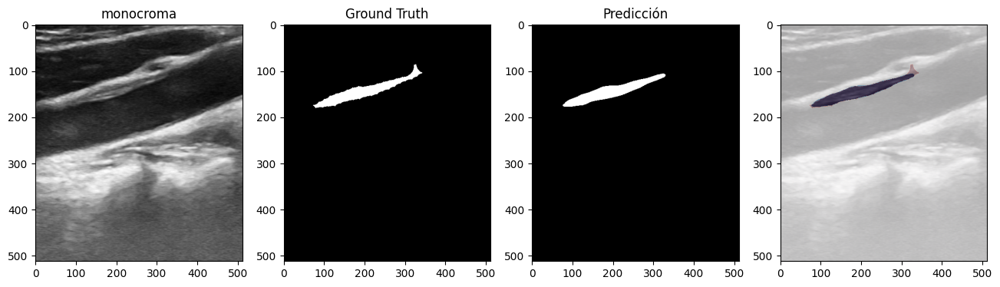

In [ ]:
for item in range(len(images_test)):
  monocroma=X_test[item]
  etiqueta=Y_test[item]
  red=preds[item]
  print('imagen'+test_ids[item])
  image_comparac(monocroma, etiqueta, red)
  fname=path+'resultado_imagen_Test_'+test_ids[item]
  plt.savefig(fname)

In [ ]:
print('Jaccard:',jacard_coef_np(Y_test, preds[:,:,0]))
print('DICE:',dice_coef_np(Y_test, preds[:,:,0]))
print('Global')


Jaccard: 0.05426843076948202
DICE: 0.10294634517394263
Global


In [ ]:

n=len(images_test)
D=0.0
J=0.0
for item in range(n):
  J=J+jacard_coef_np(Y_test[item], preds[item][:,:,0])
  D=D+dice_coef_np(Y_test[item], preds[item][:,:,0])

J=J/20
D=D/20

print('Promedio en Test')
print('Jaccard:',J)
print('DICE:',D)


Promedio en Test
Jaccard: 0.9555835278523046
DICE: 1.1065583523523248


## Predichos para train

In [ ]:
m=len(images_test)
pred_train = model.predict(X_train[0:m])

2/2 [==============================] - 2s 2s/step


In [ ]:
resul_train=pred_train >0.5

In [ ]:
D=0.0
J=0.0
for item in range(m):
  J=J+jacard_coef_np(Y_train[item], pred_train[item][:,:,0])
  D=D+dice_coef_np(Y_train[item], pred_train[item][:,:,0])

J=J/20
D=D/20

print('Promedio en Train')
print('Jaccard:',J)
print('DICE:',D)

Promedio en Train
Jaccard: 2.2584052179425913
DICE: 2.3025296350515108


imagen41
Jaccard: 0.9245567437199536
DICE: 0.9607966022274178


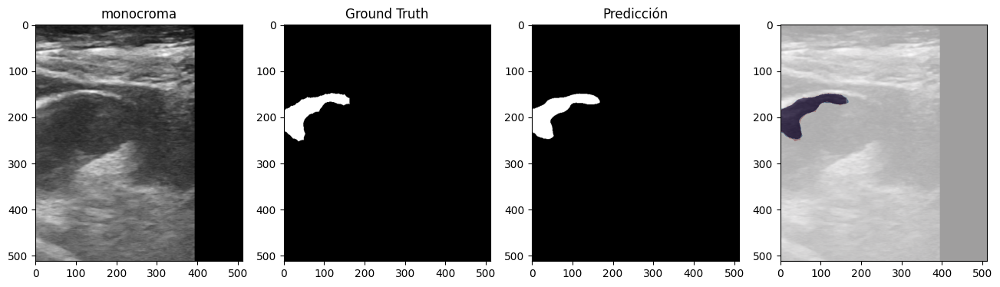

In [ ]:
item = random.randint(0, m-1)
#item = 16
monocroma=X_train[item]
etiqueta=Y_train[item]
red=pred_train[item]
print('imagen'+str(item))
image_comparac(monocroma, etiqueta, red)
print('Jaccard:',jacard_coef_np(Y_train[item], pred_train[item][:,:,0]))
print('DICE:',dice_coef_np(Y_train[item], pred_train[item][:,:,0]))

imagen17
Jaccard: 0.9999999999999933
DICE: 0.9999999999999933


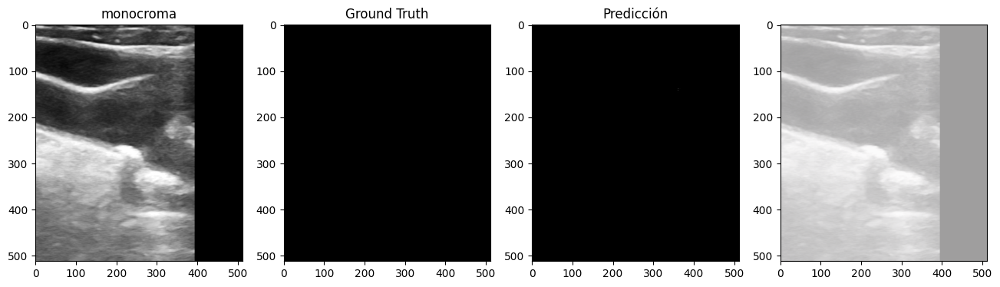

In [ ]:
item = random.randint(0, m-1)
#item = 16
monocroma=X_train[item]
etiqueta=Y_train[item]
red=pred_train[item]
print('imagen'+str(item))
image_comparac(monocroma, etiqueta, red)
print('Jaccard:',jacard_coef_np(Y_train[item], pred_train[item][:,:,0]))
print('DICE:',dice_coef_np(Y_train[item], pred_train[item][:,:,0]))

In [ ]:
## Save the Weights
#model.save_weights(path+"UNetW.h5")